# Within-subject MVPA

In [1]:
### Import packages
### Please install nltools first if you have not installed it before. See tutorials for nltools: http://neurolearn.readthedocs.io/en/latest/ 
from nltools.mask import expand_mask, collapse_mask
from nltools.data import Brain_Data
import seaborn as sns
import numpy as np
import math
import glob
import pandas as pd
import os
import matplotlib as mpl
import scipy
%matplotlib inline
from nltools.stats import fdr, threshold, fisher_r_to_z, one_sample_permutation
from nilearn.plotting import plot_glass_brain, plot_stat_map

datadir ='G:\Trial_by_trial_betas'


C:\Anaconda\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
C:\Anaconda\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
### Show the verson of nlttols
import nltools
nltools.__version__

'0.3.14'

### Read data 

In [4]:
### Check the brain data files
glob.glob(os.path.join(datadir,'SEMI*.nii'))

['G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_101.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_102.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_103.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_104.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_105.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_106.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_107.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_108.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_109.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_

In [5]:
### Load data
data = Brain_Data(glob.glob(os.path.join(datadir,'SEMI*.nii')))
info = glob.glob(os.path.join(datadir,'Trial_info.csv'))[0]
data.X = pd.read_csv(info)

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

In [9]:
### Print data
print(data)

nltools.data.brain_data.Brain_Data(data=(2823, 238955), Y=0, X=(2823, 33), mask=MNI152_T1_2mm_brain_mask.nii.gz, output_file=[])


In [10]:
### Get subject IDs
behav_data = data.X
subID = behav_data['Subject'].unique()
subID

array([1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111,
       1112, 1114, 1116, 1117, 1118, 1119, 1120, 1122, 1123, 1124, 1125,
       1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136,
       1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1146, 1147,
       1148, 1149, 1150, 1151, 1152, 1153, 1154, 1156, 1157], dtype=int64)

### Apply univariate mask 

In [34]:
PCare_mask = Brain_Data(os.path.join(datadir,'Univariate_PCare_E2_mask','Univariate_Communal_concern_positive_001.nii'))
E2_mask = Brain_Data(os.path.join(datadir,'Univariate_PCare_E2_mask','Univariate_Obligation_positive_001.nii'))

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

In [35]:
PCare_mask.data[PCare_mask.data>0]=1
PCare_mask.data[PCare_mask.data<=0]=0

E2_mask.data[E2_mask.data>0]=1
E2_mask.data[E2_mask.data<=0]=0

threshold is ignored for simple axial plots


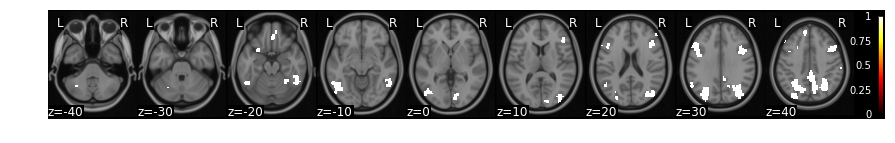

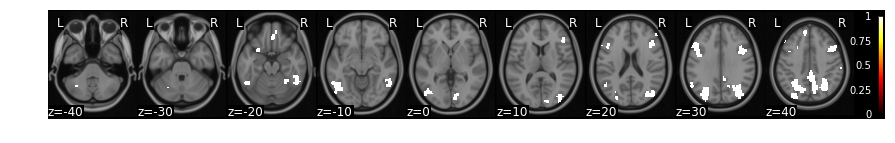

In [38]:
PCare_E2_mask = PCare_mask
PCare_E2_mask.data[E2_mask.data>0]=1
PCare_E2_mask.plot()

In [39]:
PCare_E2_mask_data  = del_data.apply_mask(PCare_E2_mask)

In [40]:
PCare_E2_mask_data

nltools.data.brain_data.Brain_Data(data=(2801, 7475), Y=0, X=(2801, 33), mask=MNI152_T1_2mm_brain_mask.nii.gz, output_file=[])

### Reciprocity prediction using univariate mask

overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.41
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.84
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.03
overall CV Correlation: -0.01


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.61
overall CV Correlation: 0.21


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.20
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.42
overall CV Correlation: 0.40


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.92
overall CV Correlation: 0.38


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.23
overall CV Correlation: 0.23


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.04
overall CV Correlation: 0.25


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.51
overall CV Correlation: 0.15


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.61
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.82
overall CV Correlation: 0.44


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.74
overall CV Correlation: -0.00


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.40
overall CV Correlation: 0.15


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.35
overall CV Correlation: 0.19


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 2.77
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.47
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.48
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.75
overall CV Correlation: -0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.39
overall CV Correlation: 0.24


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.93
overall CV Correlation: 0.14


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.82
overall CV Correlation: -0.23


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.18
overall CV Correlation: 0.25


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.83
overall CV Correlation: 0.35


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.96
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.80
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.35
overall CV Correlation: 0.14


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 10.50
overall CV Correlation: -0.22


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.98
overall CV Correlation: 0.19


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.57
overall CV Correlation: 0.12


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.20
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.50
overall CV Correlation: 0.49


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.81
overall CV Correlation: 0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 2.50
overall CV Correlation: 0.23


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.12
overall CV Correlation: 0.24


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.93
overall CV Correlation: 0.01


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.20
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.71
overall CV Correlation: -0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.19
overall CV Correlation: -0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.26
overall CV Correlation: 0.47


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.95
overall CV Correlation: 0.02


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.46
overall CV Correlation: 0.29


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.86
overall CV Correlation: -0.13


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.91
overall CV Correlation: -0.05


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.45
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.13
overall CV Correlation: -0.04


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.32
overall CV Correlation: 0.05


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.40
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.09
overall CV Correlation: 0.40


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.37
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.96
overall CV Correlation: 0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.94
overall CV Correlation: -0.03


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.17
overall CV Correlation: 0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


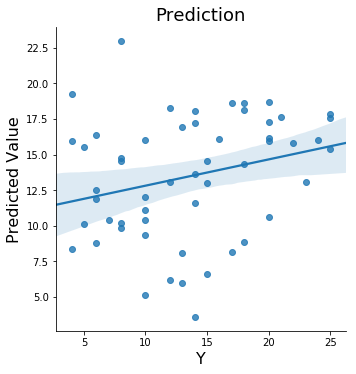

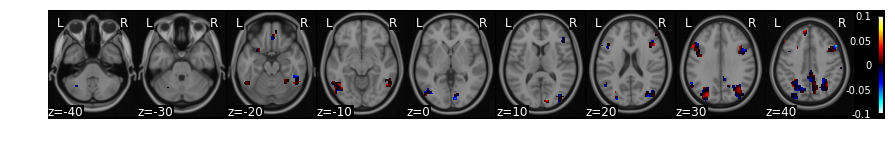

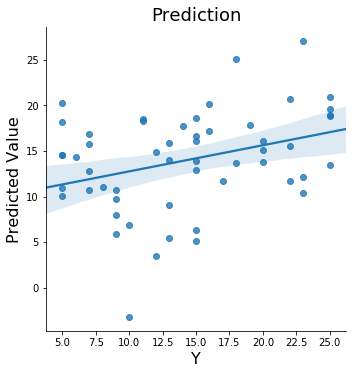

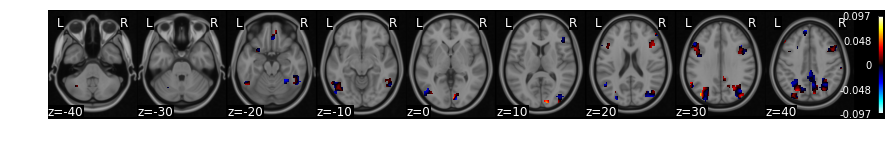

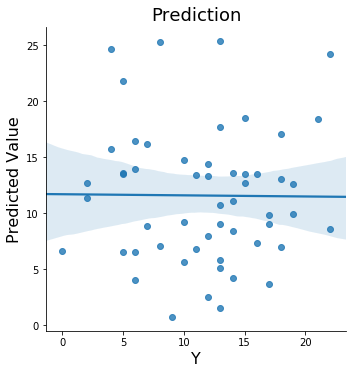

...

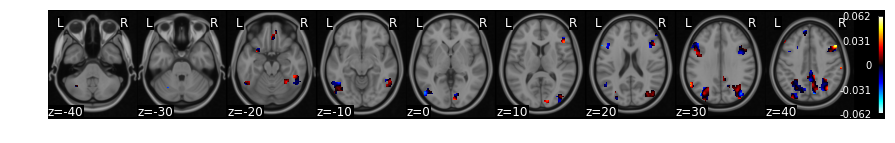

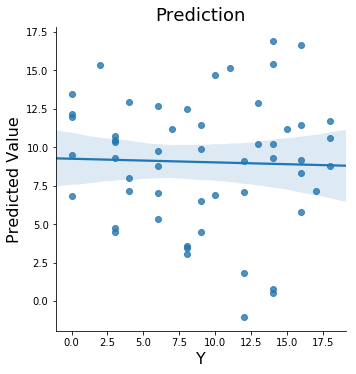

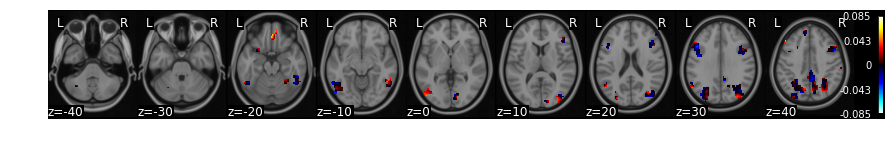

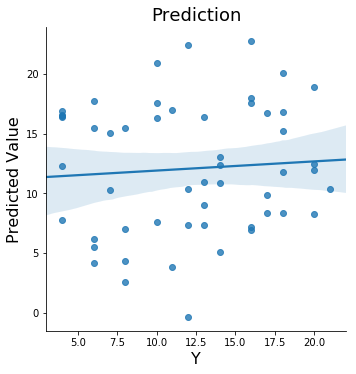

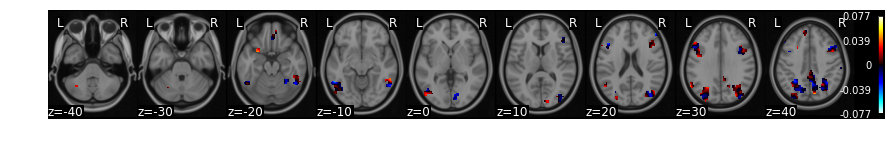

In [41]:
### Within subject MVPA for Reci_mprocity
results_r_Reci_m = np.zeros((1,53))
stats_Reci_m = []
i=0

for sub in subID:
    sub_data = PCare_E2_mask_data[PCare_E2_mask_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['Reciprocity']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_Reci_m[0,i-1] = sub_stats['r_xval']
    stats_Reci_m.append(sub_stats)
    i=i+1

{'mean': 0.16450685383408567, 'p': 0.0}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


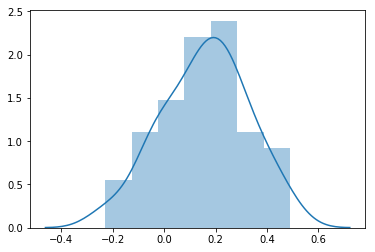

In [42]:
### Fisher-z transformation and one-sample permutation t test
group_stat_Reci_m = one_sample_permutation(np.array(fisher_r_to_z(results_r_Reci_m[0,:])),n_permute=5000)
print(group_stat_Reci_m)
sns.distplot(results_r_Reci_m[0,:])

In [43]:
### Print mean and SE
r_mean_Reci_m = np.mean(results_r_Reci_m[0,:])
print(r_mean_Reci_m)
r_sd_Reci_m = np.std(results_r_Reci_m[0,:],ddof=1)
n = len(results_r_Reci_m[0,:])
r_se_Reci_m = (r_sd_Reci_m/math.sqrt(n))
print(r_se_Reci_m)

0.15859686148570482
0.022996417514482583


threshold is ignored for simple axial plots


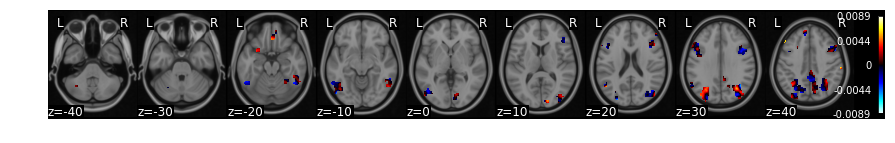

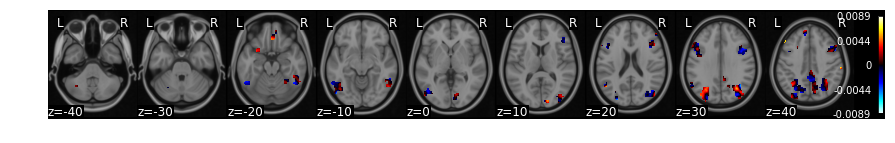

In [44]:
### Plot and write out the group-level whole brain pattern for Reci_mprocity
Reci_m_image=Brain_Data()

for i,sub in enumerate(subID):
    Reci_m_image = Reci_m_image.append(stats_Reci_m[i]['weight_map'])

Reci_m_weight_map = Reci_m_image.mean()

Reci_m_weight_map.plot()
Reci_m_weight_map.write(os.path.join(datadir,'Brain_predicted_data','Reci_m_prediction_weight_map.nii.gz'))

In [45]:
### Export cross-validated neural predictions for reciprocity
Reci_m_yfit_xval = []

for i,sub in enumerate(subID):
    Reci_m_yfit_xval = Reci_m_yfit_xval + list(stats_Reci_m[i]['yfit_xval'])
       
np.savetxt(os.path.join(datadir,'Brain_predicted_data','Reci_m_yfit_xval.txt'),Reci_m_yfit_xval) 

### Appraisals prediction using univariate mask

overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.46
overall CV Correlation: 0.24


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.42
overall CV Correlation: 0.38


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.09
overall CV Correlation: -0.04


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.69
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.08
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.00
overall CV Correlation: 0.46


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.93
overall CV Correlation: 0.41


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.24
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.03
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.03
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.97
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.09
overall CV Correlation: 0.45


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.26
overall CV Correlation: 0.14


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.27
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.81
overall CV Correlation: -0.04


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 11.62
overall CV Correlation: 0.13


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.91
overall CV Correlation: 0.31


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.28
overall CV Correlation: 0.22


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.72
overall CV Correlation: 0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.85
overall CV Correlation: 0.19


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.26
overall CV Correlation: 0.19


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.27
overall CV Correlation: -0.02


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.85
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.02
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.00
overall CV Correlation: 0.31


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.99
overall CV Correlation: -0.03


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.65
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.65
overall CV Correlation: -0.23


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.81
overall CV Correlation: 0.36


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.25
overall CV Correlation: 0.41


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.40
overall CV Correlation: 0.12


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.88
overall CV Correlation: 0.49


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.78
overall CV Correlation: 0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.46
overall CV Correlation: 0.56


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.86
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.86
overall CV Correlation: 0.09


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.30
overall CV Correlation: 0.36


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 12.99
overall CV Correlation: -0.11


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 11.68
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 13.09
overall CV Correlation: -0.13


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.19
overall CV Correlation: 0.08


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.58
overall CV Correlation: 0.30


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.10
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.82
overall CV Correlation: 0.09


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.77
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 10.96
overall CV Correlation: 0.11


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.38
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.58
overall CV Correlation: 0.24


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.67
overall CV Correlation: 0.44


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.02
overall CV Correlation: 0.24


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.25
overall CV Correlation: 0.00


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.87
overall CV Correlation: -0.02


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.01
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.82
overall CV Correlation: -0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


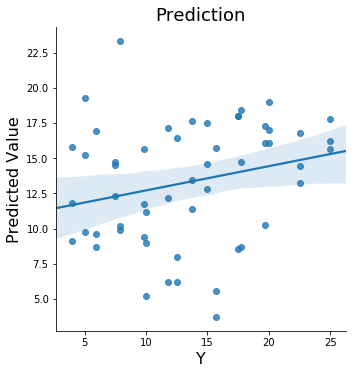

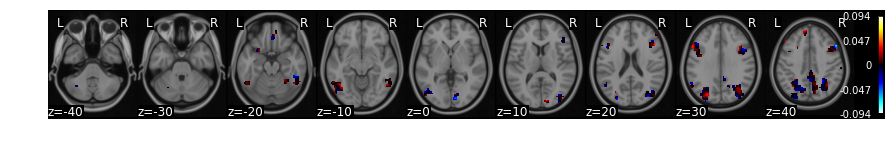

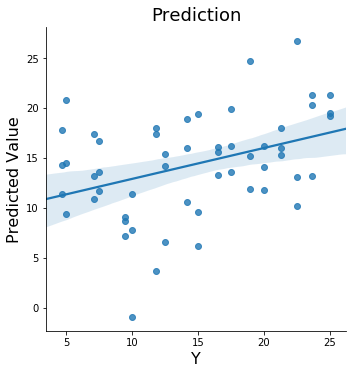

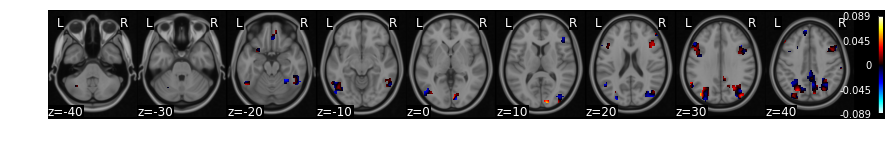

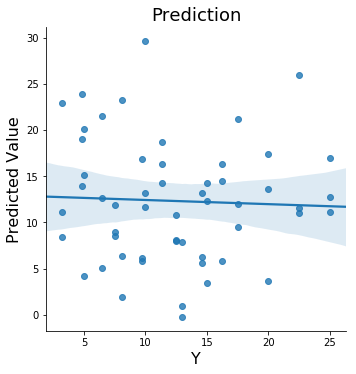

...

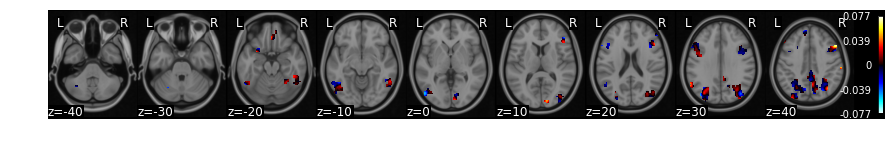

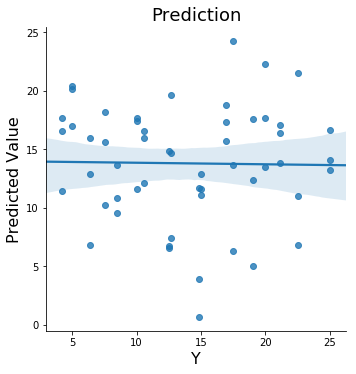

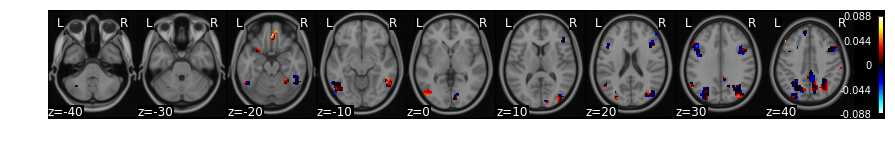

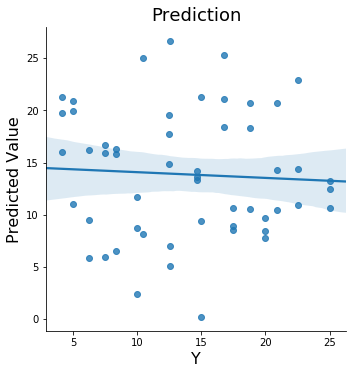

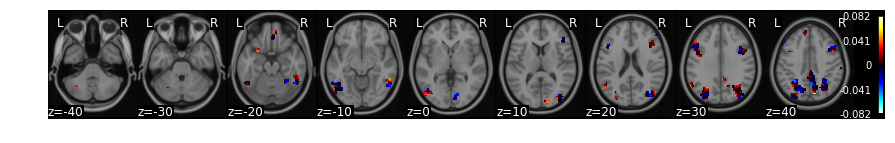

In [46]:
### Within subject MVPA for communal concern

results_r_PCare_m = np.zeros((1,53))
stats_PCare_m = []
i=0

for sub in subID:
    sub_data = PCare_E2_mask_data[PCare_E2_mask_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['PCare_model']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_PCare_m[0,i-1] = sub_stats['r_xval']
    stats_PCare_m.append(sub_stats)
    i = i+1

{'mean': 0.19002544301615532, 'p': 0.0}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


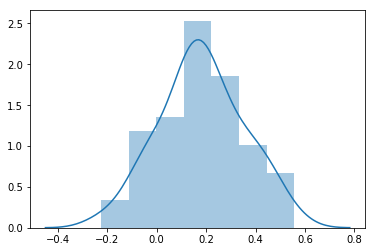

In [47]:
### Fisher-z transformation and one-sample permutation t test
group_stat_PCare_m = one_sample_permutation(np.array(fisher_r_to_z(results_r_PCare_m[0,:])),n_permute=5000)
print(group_stat_PCare_m)
sns.distplot(results_r_PCare_m[0,:])

In [48]:
### Print mean and SE
r_mean_PCare_m = np.mean(results_r_PCare_m[0,:])
print(r_mean_PCare_m)
r_sd_PCare_m = np.std(results_r_PCare_m[0,:],ddof=1)
n = len(results_r_PCare_m[0,:])
r_se_PCare_m = (r_sd_PCare_m/math.sqrt(n))
print(r_se_PCare_m)

0.18193845922671056
0.02341189564776441


threshold is ignored for simple axial plots


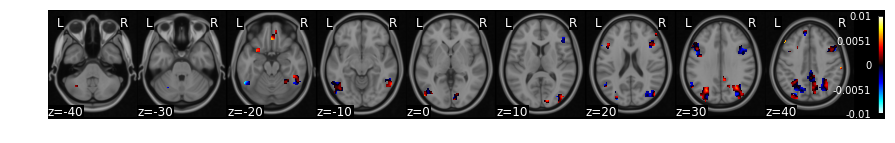

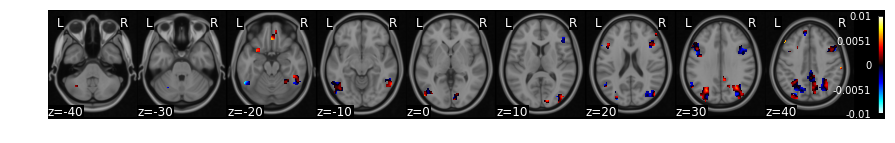

In [49]:
### Plot and write out the group-level whole brain pattern for reciprocity
PCare_m_image=Brain_Data()

for i,sub in enumerate(subID):
    PCare_m_image = PCare_m_image.append(stats_PCare_m[i]['weight_map'])

PCare_m_meight_map = PCare_m_image.mean()

PCare_m_meight_map.plot()
PCare_m_meight_map.write(os.path.join(datadir,'Brain_predicted_data','PCare_m_prediction_weight_map.nii.gz'))

In [50]:
### Export cross-validated neural predictions for communal concern
PCare_m_yfit_xval = []

for i,sub in enumerate(subID):
    PCare_m_yfit_xval = PCare_m_yfit_xval + list(stats_PCare_m[i]['yfit_xval'])
    
np.savetxt(os.path.join(datadir,'Brain_predicted_data','PCare_m_yfit_xval.txt'),PCare_m_yfit_xval)               

In [ ]:
### Within subject MVPA for obligation

results_r_E2_m = np.zeros((1,53))
stats_E2_m = []
i=0

for sub in subID:
    sub_data = PCare_E2_mask_data[PCare_E2_mask_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['E2_model']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_E2_m[0,i-1] = sub_stats['r_xval']
    stats_E2_m.append(sub_stats)
    i = i+1

{'mean': 0.09996345209896726, 'p': 0.0004}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


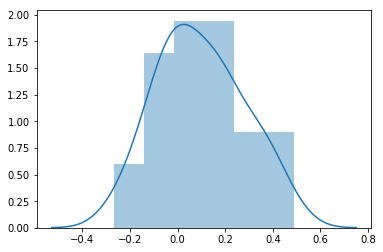

In [52]:
### Fisher-z transformation and one-sample permutation t test
group_stat_E2_m = one_sample_permutation(np.array(fisher_r_to_z(results_r_E2_m[0,:])),n_permute=5000)
print(group_stat_E2_m)
sns.distplot(results_r_E2_m[0,:])

In [53]:
### Print mean and SE
r_mean_E2_m = np.mean(results_r_E2_m[0,:])
print(r_mean_E2_m)
r_sd_E2_m = np.std(results_r_E2_m[0,:],ddof=1)
n = len(results_r_E2_m[0,:])
r_se_E2_m = (r_sd_E2_m/math.sqrt(n))
print(r_se_E2_m)

0.09579719347731987
0.02490732165342562


threshold is ignored for simple axial plots


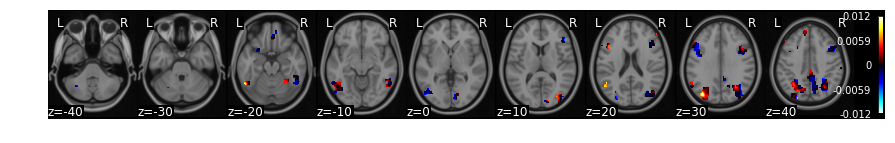

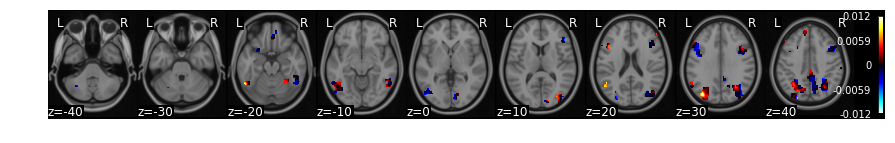

In [54]:
### Plot and write out the group-level whole brain pattern for reciprocity
E2_m_image=Brain_Data()

for i,sub in enumerate(subID):
    E2_m_image = E2_m_image.append(stats_E2_m[i]['weight_map'])

E2_m_weight_map = E2_m_image.mean()

E2_m_weight_map.plot()
E2_m_weight_map.write(os.path.join(datadir,'Brain_predicted_data','E2_m_prediction_weight_map.nii.gz'))

In [56]:
### Export cross-validated neural predictions for obligation
E2_m_yfit_xval = []

for i,sub in enumerate(subID):
    E2_m_yfit_xval = E2_m_yfit_xval + list(stats_E2_m[i]['yfit_xval'])
    
np.savetxt(os.path.join(datadir,'Brain_predicted_data','E2_m_yfit_xval.txt'),E2_m_yfit_xval)               